<a href="https://colab.research.google.com/github/Luke-687/Simulating-Chemotaxis--Q-learning-and-Heuristic-/blob/main/TESTHUERISTIC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import math
import random
import matplotlib.pyplot as plt

In [ ]:
#s is for the steepness of the gradient
def defineScene(xS,yS, s):
  x = []
  y = []
  color = []
  gradient = []
  reward = []
  #Consider 20x20 grid, source of chemical at (15,15) with a decrease in alpha by r^2
  for i in range (0,xS+1):
    for j in range (0,yS+1):
      x.append(j)
      y.append(i)
      #distance based calculations:
      distance = math.sqrt((i-(xS/2))**2+(j-(yS/2))**2)
      if(distance <= 5):
        color.append("green")
        if(not distance<=1):
          gradient.append(1/(distance**s))
          reward.append(10/(distance**s))
        else:
          gradient.append(1)
          reward.append(50)
      else:
        color.append("green")
        gradient.append(0)
        reward.append(-50)
  return x, y, gradient, reward

def calculate_velocity(posX, posY, rewards):
  posX = int(posX)
  posY = int(posY)
  currentReward = rewards[posX+posY*20]
  if(currentReward<0):
    velocity = 4
  else:
    velocity = 1.5/currentReward
  if(velocity>=4):
    velocity = 4
  return velocity

def calculate_direction(currentX, currentY, pastR, currentR, currentDirection, p):

  #Define the basic change in the direction
  change=0
  currentPos = math.sqrt((currentX-9.5)**2 + (currentY-9.5)**2)

  if(not currentR==0 and not pastR==0):

    if(currentPos<=5):

      change = 360*(abs(pastR/currentR)**0.8)*((random.choice([-1,1])))
      # print("Inside: " + str(change))

    else:

      if(pastR>currentR):

        if(abs(pastR)<abs(currentR)):
          change = (180-180*(abs((pastR)/(currentR))**p))*((random.choice([-1,1,-1,-1,-1])))
          # print("Outside: " + str(change))

        else:
          change = (180-180*(abs((currentR)/(pastR))**p))*((random.choice([-1,1,-1,-1,-1])))
          # print("Outside: " + str(change))


  newDirection = (currentDirection+change)%360
  return (newDirection)

def simulate (alpha, gamma, xS, yS,steps, steep):
  #Define the initial parameters
  velocity = 4
  direction = random.randint(10,80)
  #Starting position is some (x,y) outside of gradient
  currentX = 0
  currentY = 0
  stepsToBeMade=steps
  xG, yG, gradient, reward = defineScene(xS, yS, steep)
  #This works as an adjustment to the direction recalculation
  p=0.59
  #This works as an adjustment to the alpha and gamma in updated rewards
  test = 3.75

  #Track x,y pos
  x=[]
  y=[]

  pastReward = 0
  for i in range(0, stepsToBeMade):
    #Enter and calculate reward of values which are about to be moved on from
    currentX = max(0, min(currentX, 19))
    currentY = max(0, min(currentY, 19))
    x.append(currentX)
    y.append(currentY)

    #Find new position, and new current reward
    brownian = brownianMotion()
    changeX = velocity * math.cos(direction*math.pi/180) + brownian[0]
    changeY = velocity * math.sin(direction*math.pi/180) + brownian[1]
    currentX = x[-1] + changeX
    currentY = y[-1] + changeY
    currentX = max(0, min(currentX, 19))
    currentY = max(0, min(currentY, 19))
    currentReward = pastReward + test*alpha*(reward[int(currentX+currentY*20)]+test*gamma*(reward[int(currentX+currentY*20)]-pastReward))

    #Redifine velocity and direction for next steps
    velocity = calculate_velocity(int(currentX), int(currentY), reward)
    direction = calculate_direction(currentX, currentY, pastReward, currentReward, direction, p)
    pastReward = currentReward
  return x,y

def brownianMotion():
  result = [0,0]
  xChange = random.random()/4
  yChange = random.random()/4
  for i in range(10):
    xChange+= random.random()/100 * (-1**(random.randint(1,2)))
    yChange+= random.random()/100 * (-1**(random.randint(1,2)))
  result = [xChange, yChange]
  return result

In [ ]:
#Key values which can be alterred
alpha = 0.99
gamma = 0.99
steepness = 0.75

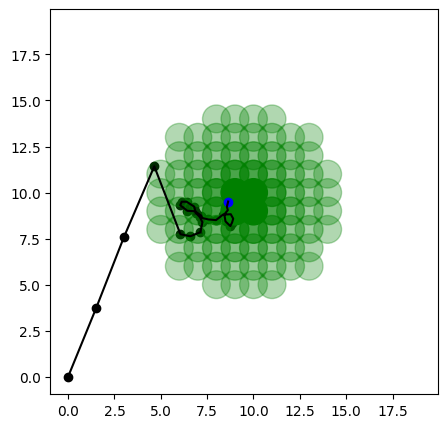

In [ ]:
plt.figure(figsize=(5, 5))

#AWB = Agent With Brownian || Define agent results and graph path
xAWB, yAWB = simulate(alpha, gamma, 19, 19, 30, steepness)
plt.plot(xAWB, yAWB, c = "black")
plt.scatter(xAWB, yAWB, c = "black")

#Define gradient field and plot it
xG, yG, alphaG, reward = defineScene(19,19,steepness)
plt.scatter(xG, yG, c = "green", s=400, alpha = alphaG)
plt.scatter(xAWB[-1], yAWB[-1], c = "blue")

In [ ]:
#USE SPACE BELOW FOR TESTS
#USE SPACE BELOW FOR TESTS
#USE SPACE BELOW FOR TESTS
#USE SPACE BELOW FOR TESTS

/tmp/ipython-input-1876049507.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


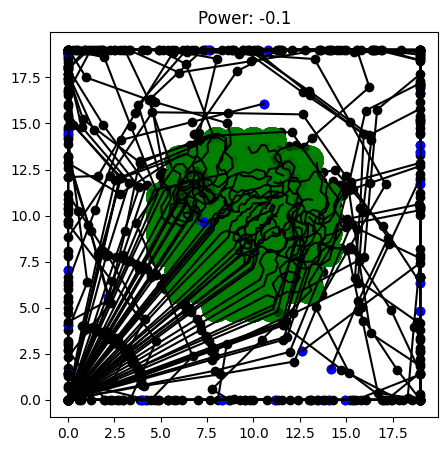

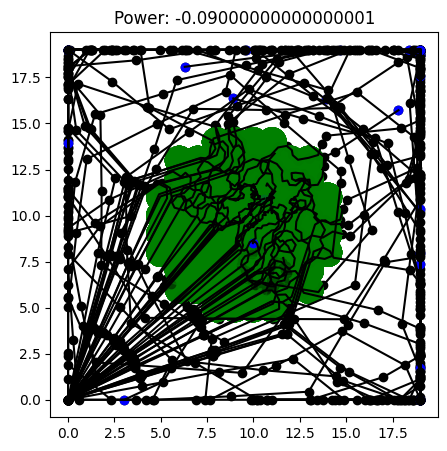

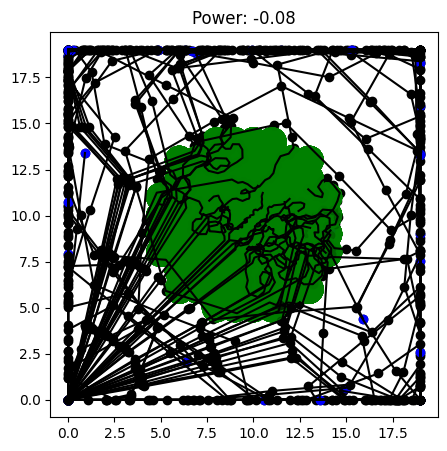

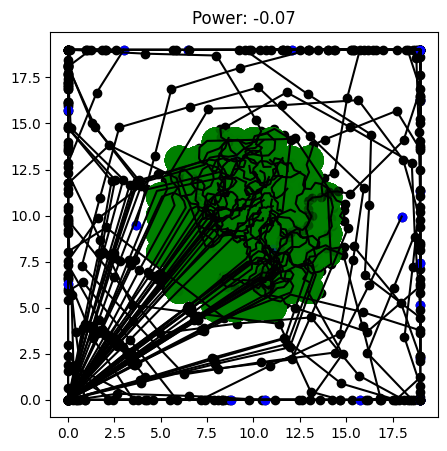

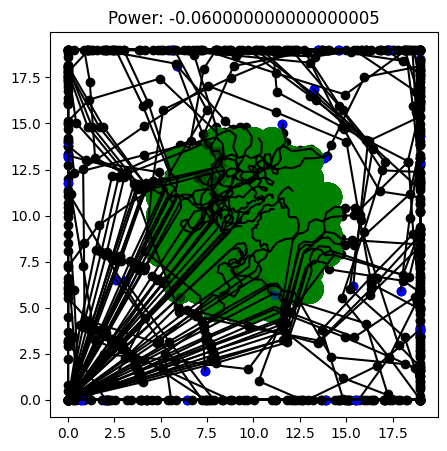

...

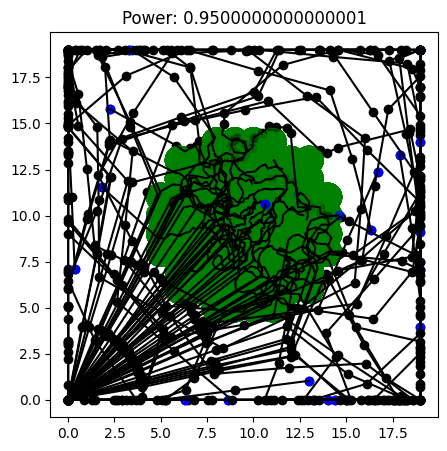

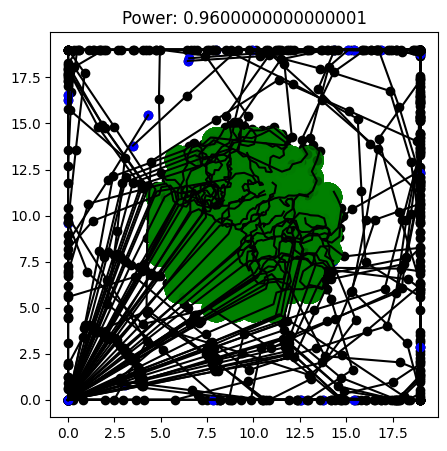

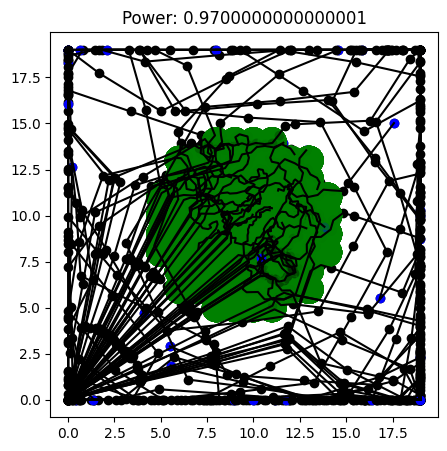

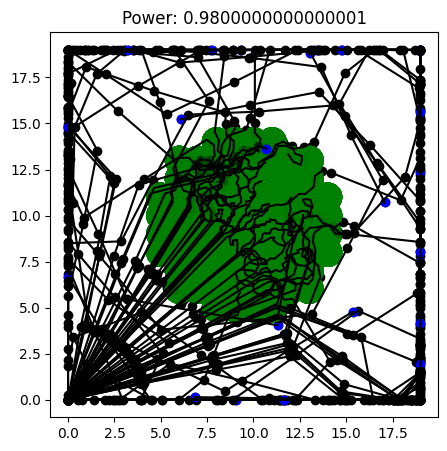

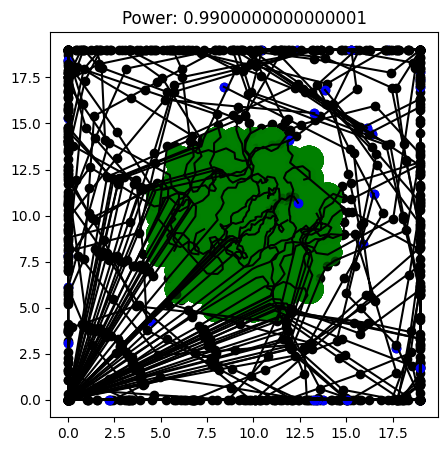

In [ ]:
for pTest in range(110):
  p = pTest/100-0.1
  plt.figure(figsize=(5, 5))
  for run in range(50):
    #AWB = Agent With Brownian || Define agent results and graph path
    xAWB, yAWB = simulate(alpha, gamma, 19, 19, 30, steepness, 3.75, 0.15)
    plt.plot(xAWB, yAWB, c = "black")
    plt.scatter(xAWB, yAWB, c = "black")

    #Define gradient field and plot it
    xG, yG, alphaG, reward = defineScene(19,19,steepness)
    plt.scatter(xG, yG, c = "green", s=400, alpha = alphaG)
    plt.scatter(xAWB[-1], yAWB[-1], c = "blue")
  plt.title("Power: " + str(p))

In [ ]:
#Test out the mutliplier onto alpha and gamma, represented by "test"
bestMultiplier = 0
bestPercInCenter = 0
multipliers = []
perc = []
for num in range(0,100):
  test = num/10
  multipliers.append(test)
  percInCenter = 0
  #Test this miltiplier 100 times
  for i in range(100):
    stepsInCenter = 0
    #AWB = Agent With Brownian || Define agent results and graph path
    xAWB, yAWB = simulate(alpha, gamma, 19, 19, 30, steepness, test)
    for step in range(len(xAWB)):
      if(math.sqrt((xAWB[step]-9.5)**2 + (yAWB[step]-9.5)**2)<=5):
        stepsInCenter+=1
    percInCenter += stepsInCenter/(3000)
  if(percInCenter>=bestPercInCenter):
    bestPercInCenter = percInCenter
    bestMultiplier = test
  perc.append(percInCenter)
print(bestMultiplier)
print(bestPercInCenter)

In [ ]:
#Test out the mutliplier onto alpha and gamma, represented by "test"
bestMultiplier = 0
bestPercFail = 100

for num in range(0,100):
  test = num/10
  multipliers.append(test)
  percFail = 0
  #Test this multiplier 100 times
  for i in range(1000):
    stepsInCenter = 0
    inCenter = False
    fail = 0
    reach = 0
    #AWB = Agent With Brownian || Define agent results and graph path
    xAWB, yAWB = simulate(alpha, gamma, 19, 19, 30, steepness, test, 0.5)
    for step in range(len(xAWB)):
      if(math.sqrt((xAWB[step]-9.5)**2 + (yAWB[step]-9.5)**2)<=5):
        inCenter = True
        reach +=1
      if(inCenter==True and math.sqrt((xAWB[step]-9.5)**2 + (yAWB[step]-9.5)**2)>5):
        fail+=1
        inCenter=False
  if(reach==0):
    percFail=1
  else:
    percFail = fail/reach
  if(bestPercFail>percFail):
    bestPercFail = percFail
    bestMultiplier = test
  if(percFail<=0.25):
    print(str(test) + ": " + str(round(percFail*100, 2)) + "%")

NameError: name 'multipliers' is not defined